In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_excel(r"C:\Users\Lenovo\Desktop\proj\hd grad\Heart Disease.xlsx")
df.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,No,16.60,Yes,No,No,3.0,30.0,No,Female,55-59,White,Yes,Yes,Very good,5.0,Yes,No,Yes
1,No,20.34,No,No,Yes,0.0,0.0,No,Female,80 or older,White,No,Yes,Very good,7.0,No,No,No
2,No,26.58,Yes,No,No,20.0,30.0,No,Male,65-69,White,Yes,Yes,Fair,8.0,Yes,No,No
3,No,24.21,No,No,No,0.0,0.0,No,Female,75-79,White,No,No,Good,6.0,No,No,Yes
4,No,23.71,No,No,No,28.0,0.0,Yes,Female,40-44,White,No,Yes,Very good,8.0,No,No,No


In [3]:
df.shape

(319795, 18)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319795 entries, 0 to 319794
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   HeartDisease      319795 non-null  object 
 1   BMI               319795 non-null  float64
 2   Smoking           319795 non-null  object 
 3   AlcoholDrinking   319795 non-null  object 
 4   Stroke            319795 non-null  object 
 5   PhysicalHealth    319795 non-null  float64
 6   MentalHealth      319795 non-null  float64
 7   DiffWalking       319795 non-null  object 
 8   Sex               319795 non-null  object 
 9   AgeCategory       319795 non-null  object 
 10  Race              319795 non-null  object 
 11  Diabetic          319795 non-null  object 
 12  PhysicalActivity  319795 non-null  object 
 13  GenHealth         319795 non-null  object 
 14  SleepTime         319795 non-null  float64
 15  Asthma            319795 non-null  object 
 16  KidneyDisease     31

In [5]:
df.isnull().sum()

HeartDisease        0
BMI                 0
Smoking             0
AlcoholDrinking     0
Stroke              0
PhysicalHealth      0
MentalHealth        0
DiffWalking         0
Sex                 0
AgeCategory         0
Race                0
Diabetic            0
PhysicalActivity    0
GenHealth           0
SleepTime           0
Asthma              0
KidneyDisease       0
SkinCancer          0
dtype: int64

In [6]:
df.duplicated()

0         False
1         False
2         False
3         False
4         False
          ...  
319790    False
319791    False
319792    False
319793    False
319794    False
Length: 319795, dtype: bool

## Pandas profiling

In [7]:
from pandas_profiling import ProfileReport

In [8]:
profile = ProfileReport(df)
profile.to_widgets()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

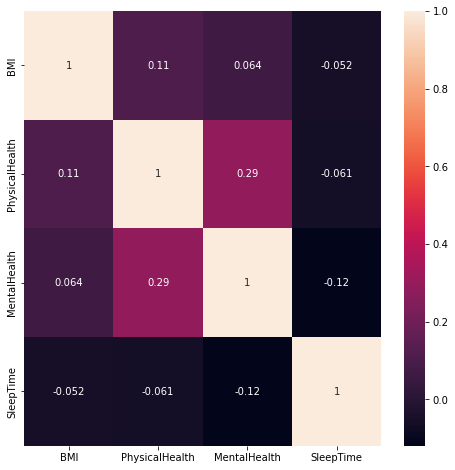

In [9]:
plt.figure(figsize=(8,8))
sns.heatmap(df.corr(),annot=True)

<AxesSubplot:xlabel='Smoking', ylabel='count'>

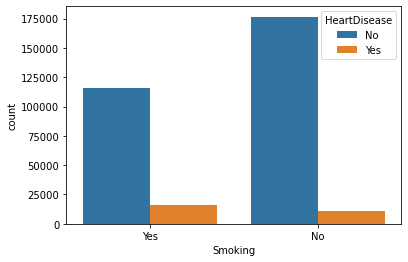

In [10]:
#sns.countplot(df.HeartDisease)
sns.countplot(x='Smoking',hue='HeartDisease',data=df)

## its an unbalanced dataset

In [11]:
data = df[df['HeartDisease']=='Yes']
data

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
5,Yes,28.87,Yes,No,No,6.0,0.0,Yes,Female,75-79,Black,No,No,Fair,12.0,No,No,No
10,Yes,34.30,Yes,No,No,30.0,0.0,Yes,Male,60-64,White,Yes,No,Poor,15.0,Yes,No,No
35,Yes,32.98,Yes,No,Yes,10.0,0.0,Yes,Male,75-79,White,Yes,Yes,Poor,4.0,No,No,Yes
42,Yes,25.06,No,No,No,0.0,0.0,Yes,Female,80 or older,White,Yes,No,Good,7.0,No,No,Yes
43,Yes,30.23,Yes,No,No,6.0,2.0,Yes,Female,75-79,White,Yes,Yes,Fair,8.0,No,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319765,Yes,38.45,No,No,Yes,30.0,15.0,Yes,Female,55-59,Hispanic,Yes,Yes,Poor,6.0,Yes,No,No
319767,Yes,36.21,Yes,No,No,0.0,0.0,Yes,Female,75-79,Hispanic,Yes,Yes,Good,8.0,No,No,No
319781,Yes,37.12,Yes,No,No,0.0,0.0,No,Male,35-39,Hispanic,No,Yes,Very good,7.0,No,No,No
319786,Yes,33.20,Yes,No,No,0.0,0.0,No,Female,60-64,Hispanic,Yes,Yes,Very good,8.0,Yes,No,No


In [12]:
smoke=data['Smoking'].value_counts()
smoke

Yes    16037
No     11336
Name: Smoking, dtype: int64

In [13]:
labels=["No",'Yes']

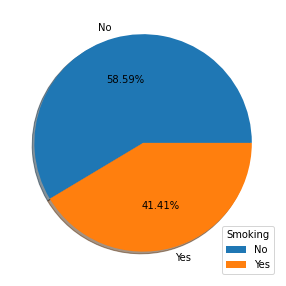

In [14]:
plt.figure(figsize=(5,5))
plt.pie(smoke,labels=labels,autopct='%2.2f%%',shadow=True)#autopct enables you to display the percent value using Python string formatting
plt.legend(title='Smoking',loc='lower right')
plt.show()

In [15]:
def  bar_chart(feature):
    live=df[df['HeartDisease']=='No'][feature].value_counts()
    die=df[df['HeartDisease']=='Yes'][feature].value_counts()
    df1=pd.DataFrame([live,die])
    df1.index=['Live','Die']
    df1.plot(kind='bar',figsize=(10,5))

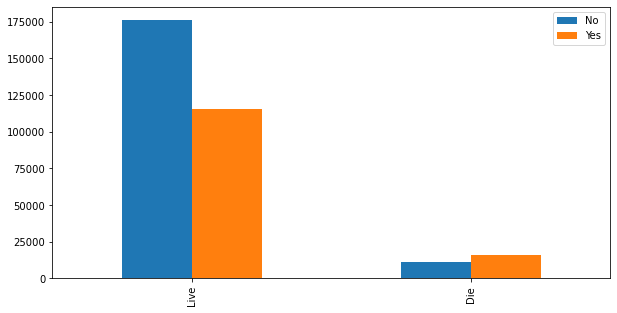

In [16]:
bar_chart('Smoking')

<AxesSubplot:xlabel='BMI', ylabel='Density'>

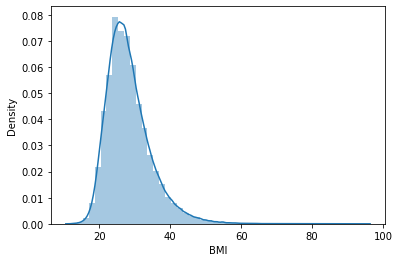

In [17]:
sns.distplot(df['BMI']) #A Distplot or distribution plot, depicts the variation in the data distribution.

In [18]:
def kde(x):
    facet=sns.FacetGrid(df,hue="HeartDisease",aspect=4)
    facet.map(sns.kdeplot,x,shade=True)
    facet.set(xlim=(df[x].min(),df[x].max()))#Limits for each of the axes on each facet (only relevant when share{x, y} is True).
    facet.add_legend()
    plt.show()

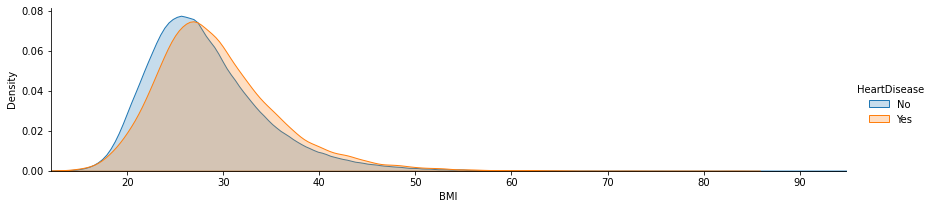

In [19]:
kde('BMI')

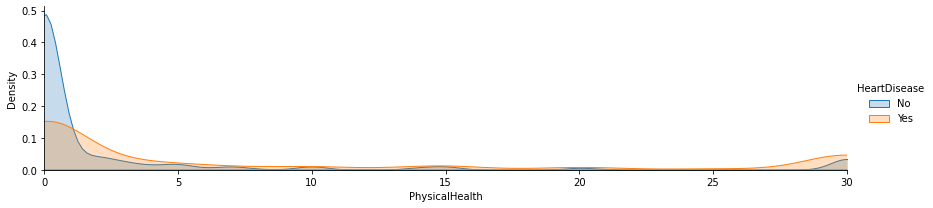

In [20]:
kde('PhysicalHealth')

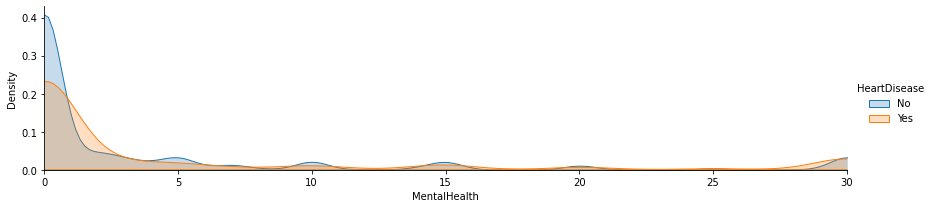

In [21]:
kde('MentalHealth')

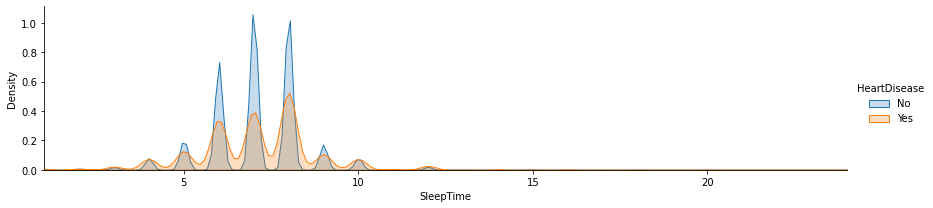

In [22]:
kde('SleepTime')

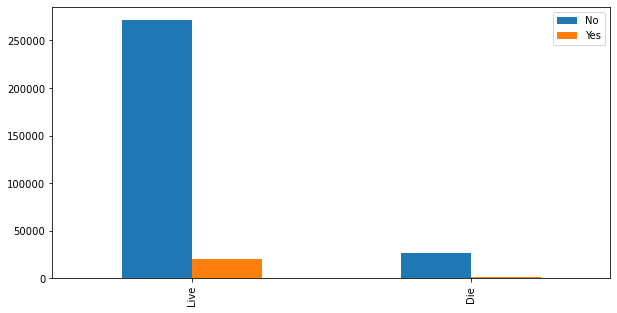

In [23]:
bar_chart('AlcoholDrinking')

In [24]:
AlcoholDrinking=data['AlcoholDrinking'].value_counts()
AlcoholDrinking

No     26232
Yes     1141
Name: AlcoholDrinking, dtype: int64

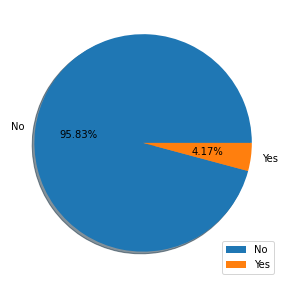

In [25]:
plt.figure(figsize=(5,5))
plt.pie(AlcoholDrinking,labels=labels,autopct='%2.2f%%',shadow=True)#autopct enables you to display the percent value using Python string formatting
plt.legend(title='',loc='lower right')
plt.show()

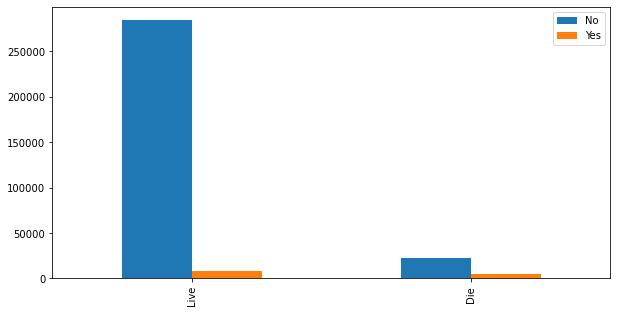

In [26]:
bar_chart('Stroke')

In [27]:
Stroke=data['Stroke'].value_counts()
Stroke

No     22984
Yes     4389
Name: Stroke, dtype: int64

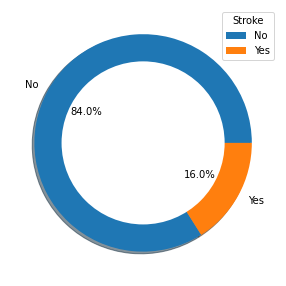

In [28]:
plt.figure(figsize=(5,5))
plt.pie(Stroke,labels=labels,autopct='%2.1f%%',shadow=True)
circle=plt.Circle(xy=(0,0),radius=0.75,facecolor='white')
plt.gca().add_artist(circle)
plt.legend(title='Stroke',loc='upper right')
plt.show()

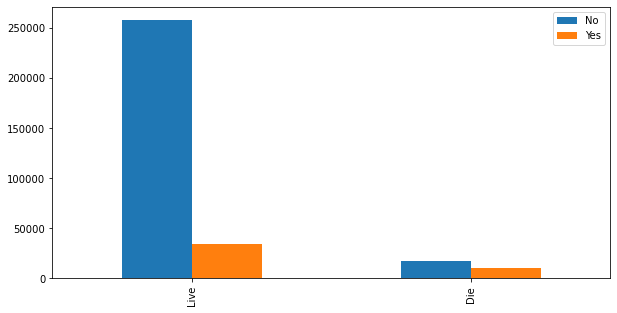

In [29]:
bar_chart('DiffWalking')

In [30]:
DiffWalking=data['DiffWalking'].value_counts()

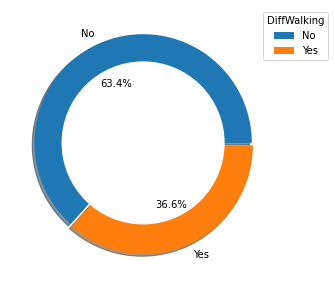

In [31]:
plt.figure(figsize=(5,5))
plt.pie(DiffWalking,labels=labels,explode=[0,0.025] ,autopct='%2.1f%%',shadow=True)
circle=plt.Circle(xy=(0,0),radius=0.75,facecolor='white')
plt.gca().add_artist(circle)
plt.legend(title='DiffWalking',loc='upper right',bbox_to_anchor=(1.2,1))
plt.show()

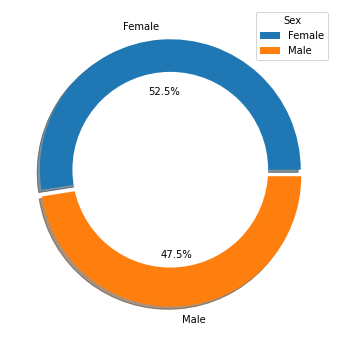

In [32]:
Sex=df['Sex'].value_counts()
Sex
labels=['Female','Male']
plt.figure(figsize=(6,6))
plt.pie(Sex,labels=labels,explode=[0,0.05] ,autopct='%2.1f%%',shadow=True)
circle=plt.Circle(xy=(0,0),radius=0.75,facecolor='white')
plt.gca().add_artist(circle)
plt.legend(title='Sex',loc='upper right')
plt.show()

In [33]:
Race=df['Race'].value_counts()
Race

White                             245212
Hispanic                           27446
Black                              22939
Other                              10928
Asian                               8068
American Indian/Alaskan Native      5202
Name: Race, dtype: int64

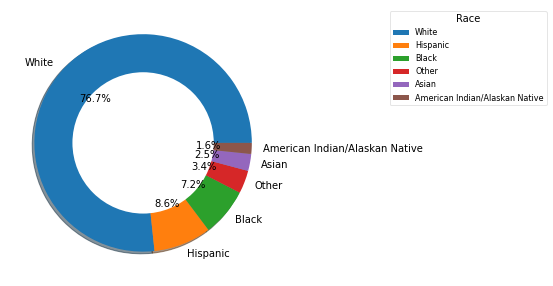

In [34]:
labels=['White','Hispanic','Black','Other','Asian','American Indian/Alaskan Native']
plt.figure(figsize=(5,5))
plt.pie(Race,labels=labels,autopct='%2.1f%%',shadow=True)
circle=plt.Circle(xy=(0,0),radius=0.65,facecolor='white')
plt.gca().add_artist(circle)
plt.legend(title='Race',loc='upper right',framealpha=0.5,fontsize=8,bbox_to_anchor=(2,1))
plt.show()

In [35]:
PhysicalActivity=df['PhysicalActivity'].value_counts()
PhysicalActivity

Yes    247957
No      71838
Name: PhysicalActivity, dtype: int64

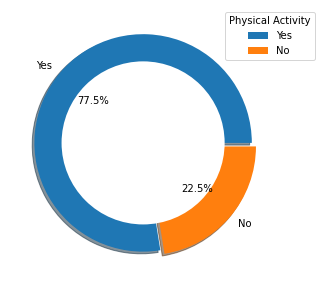

In [36]:
labels=['Yes','No']
plt.figure(figsize=(5,5))
plt.pie(PhysicalActivity,labels=labels,explode=[0,0.05] ,autopct='%2.1f%%',shadow=True)
circle=plt.Circle(xy=(0,0),radius=0.75,facecolor='white')
plt.gca().add_artist(circle)
plt.legend(title='Physical Activity',loc='upper right',bbox_to_anchor=(1.15,1))
plt.show()

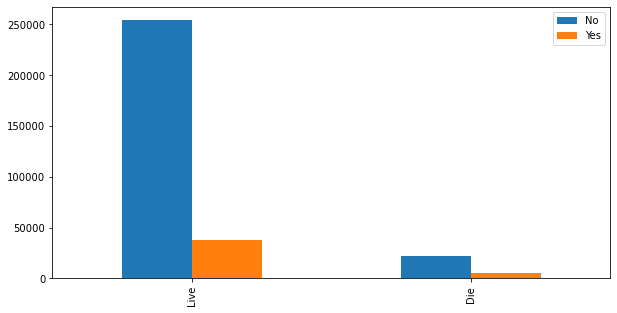

In [37]:
bar_chart('Asthma')


In [38]:
SkinCancer=data['SkinCancer'].value_counts()
SkinCancer

No     22393
Yes     4980
Name: SkinCancer, dtype: int64

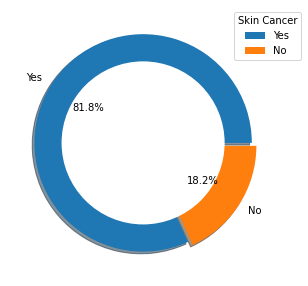

In [39]:
plt.figure(figsize=(5,5))
plt.pie(SkinCancer,labels=labels,explode=[0,0.05] ,autopct='%2.1f%%',shadow=True)
circle=plt.Circle(xy=(0,0),radius=0.75,facecolor='white')
plt.gca().add_artist(circle)
plt.legend(title='Skin Cancer',loc='upper right',bbox_to_anchor=(1.1,1))
plt.show()

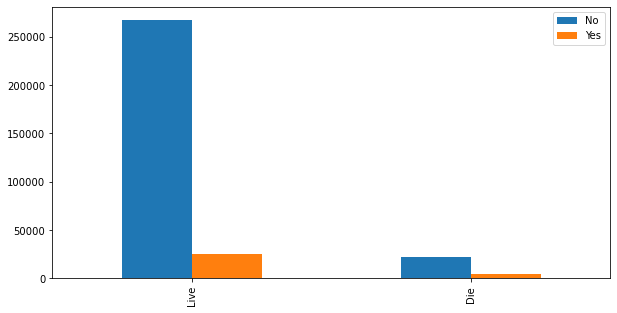

In [40]:
 bar_chart('SkinCancer')

# Data preprocessing for balancing


In [41]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import r2_score,mean_absolute_error,accuracy_score

In [42]:
from sklearn.preprocessing import LabelEncoder

In [43]:
le=LabelEncoder()

In [44]:
list=['HeartDisease','Smoking', 'AlcoholDrinking', 'Stroke','DiffWalking', 'Sex', 'AgeCategory',
       'Race', 'Diabetic', 'PhysicalActivity', 'GenHealth', 'Asthma', 'KidneyDisease', 'SkinCancer']
for i in list:
    df[i]=le.fit_transform(df[i])

In [45]:
df.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,0,16.60,1,0,0,3.0,30.0,0,0,7,5,2,1,4,5.0,1,0,1
1,0,20.34,0,0,1,0.0,0.0,0,0,12,5,0,1,4,7.0,0,0,0
2,0,26.58,1,0,0,20.0,30.0,0,1,9,5,2,1,1,8.0,1,0,0
3,0,24.21,0,0,0,0.0,0.0,0,0,11,5,0,0,2,6.0,0,0,1
4,0,23.71,0,0,0,28.0,0.0,1,0,4,5,0,1,4,8.0,0,0,0


In [46]:
x=df.drop(columns=['HeartDisease'])
y=df['HeartDisease']

In [47]:
x.sample(10)

,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
91089,28.70,0,0,0,0.0,0.0,0,1,7,5,0,1,4,9.0,0,0,0
44457,28.35,0,0,0,0.0,0.0,0,0,6,5,0,1,4,7.0,0,0,0
138898,25.11,1,0,0,0.0,10.0,0,1,0,5,0,0,4,8.0,0,0,0
279804,22.87,1,0,0,0.0,0.0,0,0,7,5,0,0,4,7.0,0,0,0
89361,25.00,0,0,0,0.0,0.0,0,1,2,5,0,1,0,6.0,0,0,0
246336,38.52,1,0,0,0.0,0.0,0,1,9,5,2,1,0,10.0,0,0,0
95025,48.71,0,0,0,0.0,7.0,0,0,1,2,2,1,4,6.0,0,0,0
297097,26.61,0,0,0,1.0,0.0,0,1,9,5,0,1,2,6.0,0,0,0
218495,19.97,0,0,0,0.0,0.0,0,0,9,5,0,1,0,7.0,0,0,0
117081,26.09,1,0,0,0.0,0.0,0,0,9,5,0,1,4,7.0,1,0,0


# Undersampling

In [48]:
#pip install imbalanced-learn

In [49]:
from imblearn.under_sampling import NearMiss

In [50]:
NearMiss_obj = NearMiss()
new_x , new_y = NearMiss_obj.fit_resample(x,y)

In [51]:
new_y

0        0
1        0
2        0
3        0
4        0
        ..
54741    1
54742    1
54743    1
54744    1
54745    1
Name: HeartDisease, Length: 54746, dtype: int32

In [52]:
new_y.value_counts()

0    27373
1    27373
Name: HeartDisease, dtype: int64

In [53]:
df2=pd.DataFrame(new_x)
df2.head()


,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,25.10,0,0,0,0.0,0.0,0,1,9,5,0,1,4,7.0,0,0,0
1,22.24,1,0,0,0.0,0.0,0,1,11,5,0,1,4,7.0,0,0,0
2,26.63,0,0,0,0.0,0.0,0,0,12,5,0,1,2,8.0,0,0,0
3,25.10,0,0,0,0.0,0.0,0,1,9,5,0,1,4,7.0,0,0,0
4,26.63,0,0,0,0.0,0.0,0,0,12,5,0,1,2,8.0,0,0,0


In [54]:
df3=pd.DataFrame(new_y)
df3.head()

,HeartDisease
0,0
1,0
2,0
3,0
4,0


In [55]:
df4=pd.concat([df2,df3],axis=1)
df4

,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer,HeartDisease
0,25.10,0,0,0,0.0,0.0,0,1,9,5,0,1,4,7.0,0,0,0,0
1,22.24,1,0,0,0.0,0.0,0,1,11,5,0,1,4,7.0,0,0,0,0
2,26.63,0,0,0,0.0,0.0,0,0,12,5,0,1,2,8.0,0,0,0,0
3,25.10,0,0,0,0.0,0.0,0,1,9,5,0,1,4,7.0,0,0,0,0
4,26.63,0,0,0,0.0,0.0,0,0,12,5,0,1,2,8.0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54741,38.45,0,0,1,30.0,15.0,1,0,7,3,2,1,3,6.0,1,0,0,1
54742,36.21,1,0,0,0.0,0.0,1,0,11,3,2,1,2,8.0,0,0,0,1
54743,37.12,1,0,0,0.0,0.0,0,1,3,3,0,1,4,7.0,0,0,0,1
54744,33.20,1,0,0,0.0,0.0,0,0,8,3,2,1,4,8.0,1,0,0,1


# Feature ranking


In [56]:
df4.nunique()

BMI                 2267
Smoking                2
AlcoholDrinking        2
Stroke                 2
PhysicalHealth        31
MentalHealth          31
DiffWalking            2
Sex                    2
AgeCategory           13
Race                   6
Diabetic               4
PhysicalActivity       2
GenHealth              5
SleepTime             22
Asthma                 2
KidneyDisease          2
SkinCancer             2
HeartDisease           2
dtype: int64

In [57]:
from sklearn.ensemble import ExtraTreesClassifier # Decison tree

In [58]:
extr = ExtraTreesClassifier()

In [59]:
extr.fit(new_x,new_y)

ExtraTreesClassifier()

In [60]:
feature_importance = extr.feature_importances_
feature_importance  

array([0.24046654, 0.00847625, 0.00731182, 0.03924384, 0.13692774,
       0.08334897, 0.11124507, 0.00608985, 0.03410851, 0.04607497,
       0.06615148, 0.06573446, 0.04958338, 0.03913795, 0.03312162,
       0.02172187, 0.01125568])

In [61]:
imp = pd.DataFrame(feature_importance, columns=['Gain_Score'])
imp.head(10)

,Gain_Score
0,0.240467
1,0.008476
2,0.007312
3,0.039244
4,0.136928
5,0.083349
6,0.111245
7,0.006090
8,0.034109
9,0.046075


In [62]:
new_x.columns

Index(['BMI', 'Smoking', 'AlcoholDrinking', 'Stroke', 'PhysicalHealth',
       'MentalHealth', 'DiffWalking', 'Sex', 'AgeCategory', 'Race', 'Diabetic',
       'PhysicalActivity', 'GenHealth', 'SleepTime', 'Asthma', 'KidneyDisease',
       'SkinCancer'],
      dtype='object')

In [63]:
cols = pd.DataFrame(new_x.columns, columns=['Feature_Names'])
cols.head(10)

,Feature_Names
0,BMI
1,Smoking
2,AlcoholDrinking
3,Stroke
4,PhysicalHealth
5,MentalHealth
6,DiffWalking
7,Sex
8,AgeCategory
9,Race


In [64]:
gains = pd.concat([cols,imp],axis=1)
gains

,Feature_Names,Gain_Score
0,BMI,0.240467
1,Smoking,0.008476
2,AlcoholDrinking,0.007312
3,Stroke,0.039244
4,PhysicalHealth,0.136928
5,MentalHealth,0.083349
6,DiffWalking,0.111245
7,Sex,0.006090
8,AgeCategory,0.034109
9,Race,0.046075


In [65]:
newx = gains.nlargest(18,'Gain_Score')
newx

,Feature_Names,Gain_Score
0,BMI,0.240467
4,PhysicalHealth,0.136928
6,DiffWalking,0.111245
5,MentalHealth,0.083349
10,Diabetic,0.066151
11,PhysicalActivity,0.065734
12,GenHealth,0.049583
9,Race,0.046075
3,Stroke,0.039244
13,SleepTime,0.039138


<AxesSubplot:xlabel='Gain_Score', ylabel='Feature_Names'>

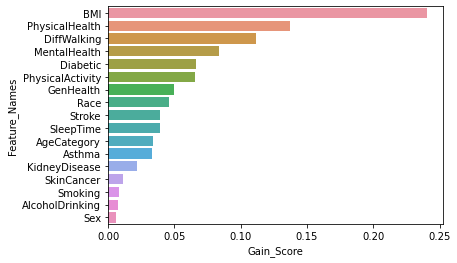

In [66]:
sns.barplot(x='Gain_Score',y='Feature_Names',data=newx)


<AxesSubplot:>

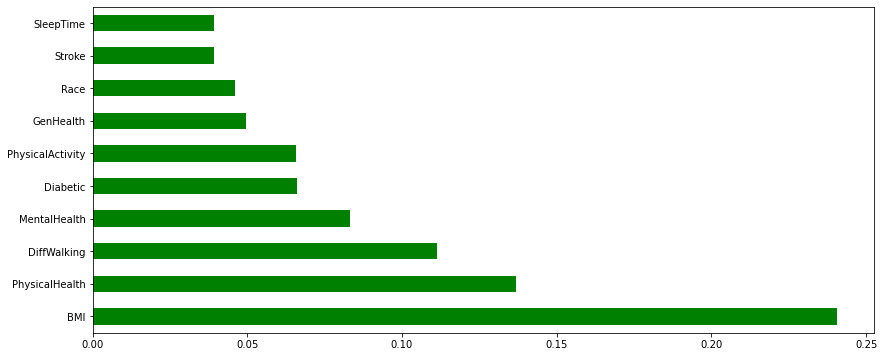

In [67]:
features = pd.Series(extr.feature_importances_, index = x.columns)
plt.figure(figsize=(14,6))
features.nlargest(10).plot(kind='barh', color='g')

In [68]:
from sklearn.feature_selection import SelectKBest,f_classif #chi2 only when features are non negative

In [69]:
model2 = SelectKBest(score_func=f_classif)


In [70]:
feature_score = model2.fit(new_x,new_y)


In [71]:
feature_score.scores_

array([3.75440127e+03, 2.03552236e+03, 6.95297966e+02, 4.83533549e+03,
       1.25312036e+04, 6.96957949e+03, 1.36347702e+04, 2.23507248e+02,
       2.12111452e+00, 4.54938853e+03, 9.24225452e+03, 9.11220252e+03,
       1.44917353e+03, 4.00600240e+02, 4.86418830e+03, 3.66576795e+03,
       9.91111023e+02])

In [72]:
cols = pd.DataFrame(feature_score.scores_ , columns=['Feature_Scores'])
cols

,Feature_Scores
0,3754.401268
1,2035.522364
2,695.297966
3,4835.335493
4,12531.203572
5,6969.579494
6,13634.770216
7,223.507248
8,2.121115
9,4549.388533


In [73]:
col2 = pd.DataFrame(new_x.columns, columns=['Feature_Names'])
col2.head()

,Feature_Names
0,BMI
1,Smoking
2,AlcoholDrinking
3,Stroke
4,PhysicalHealth


In [74]:
scores = pd.concat([col2,cols],axis=1)
scores

,Feature_Names,Feature_Scores
0,BMI,3754.401268
1,Smoking,2035.522364
2,AlcoholDrinking,695.297966
3,Stroke,4835.335493
4,PhysicalHealth,12531.203572
5,MentalHealth,6969.579494
6,DiffWalking,13634.770216
7,Sex,223.507248
8,AgeCategory,2.121115
9,Race,4549.388533


In [75]:
new = scores.nlargest(18,'Feature_Scores')
new

,Feature_Names,Feature_Scores
6,DiffWalking,13634.770216
4,PhysicalHealth,12531.203572
10,Diabetic,9242.254520
11,PhysicalActivity,9112.202523
5,MentalHealth,6969.579494
14,Asthma,4864.188299
3,Stroke,4835.335493
9,Race,4549.388533
0,BMI,3754.401268
15,KidneyDisease,3665.767952


Text(0.5, 1.0, 'Feature ranking using SelectKBest classifier')

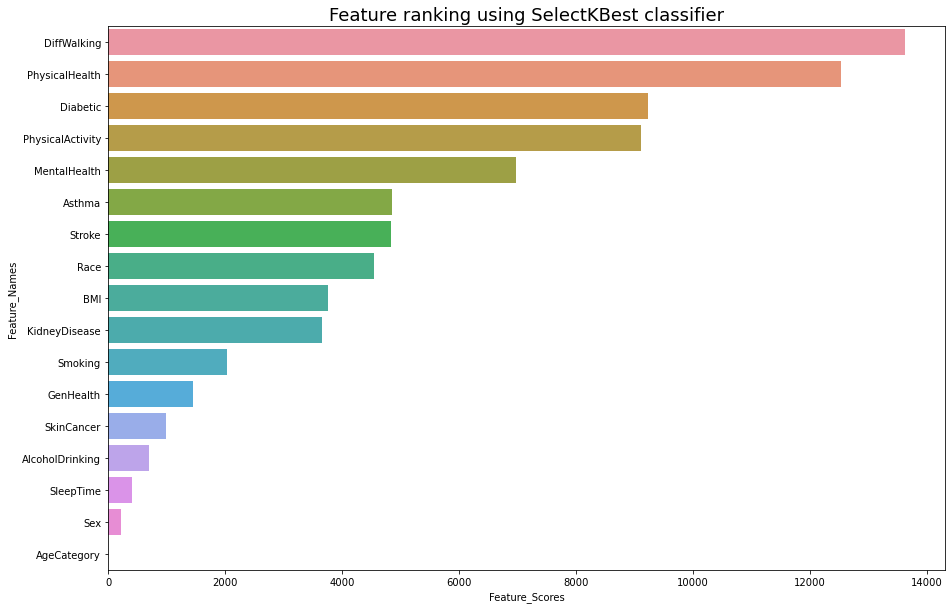

In [76]:
plt.figure(figsize=(15,10))
sns.barplot(x='Feature_Scores',y='Feature_Names',data=new)
plt.title('Feature ranking using SelectKBest classifier',fontsize=18)


# PCA

In [77]:
#FEATURE SCALING 
from sklearn.preprocessing import MinMaxScaler

In [78]:
mmx = MinMaxScaler() 

In [79]:
scaled_x = mmx.fit_transform(new_x)

In [80]:
from sklearn.decomposition import PCA

In [81]:
pca = PCA(n_components=3)
x_pca = pca.fit_transform(scaled_x)

In [82]:
x_pca

array([[-0.66189794,  0.02120688,  0.29702217],
       [-0.25531911, -0.64985319, -0.31890117],
       [-0.37867606,  0.74642631, -0.25385914],
       ...,
       [-0.23144017, -0.65952301, -0.28590684],
       [ 0.30978334,  0.11686356, -0.80242734],
       [ 1.24148148, -0.43430357,  0.48570946]])

In [83]:
features = pd.DataFrame(x_pca, columns=['pca1','pca2','pca3'])

In [84]:
import plotly.express as pl
pl.scatter_3d(features, x='pca1',y='pca2',z='pca3', color='pca1')

# EDA for Balanced Data


## Pandas Profiling

In [85]:
profile = ProfileReport(df)
profile.to_widgets()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:xlabel='Smoking', ylabel='count'>

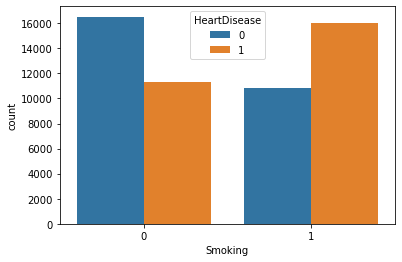

In [86]:
sns.countplot(x='Smoking',hue='HeartDisease',data=df4)


In [87]:
def KDE(x):
    facet=sns.FacetGrid(df4,hue="HeartDisease",aspect=4)
    facet.map(sns.kdeplot,x,shade=True)
    facet.set(xlim=(df4[x].min(),df4[x].max()))
    facet.add_legend()
    plt.show()

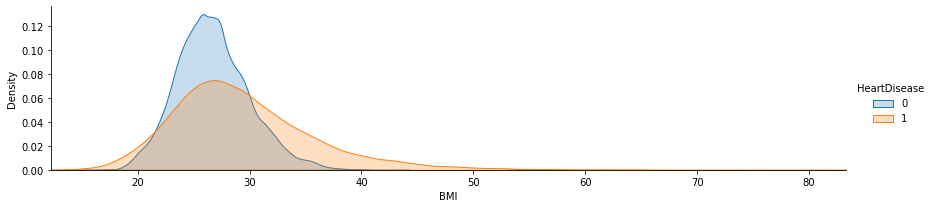

In [88]:
KDE('BMI')

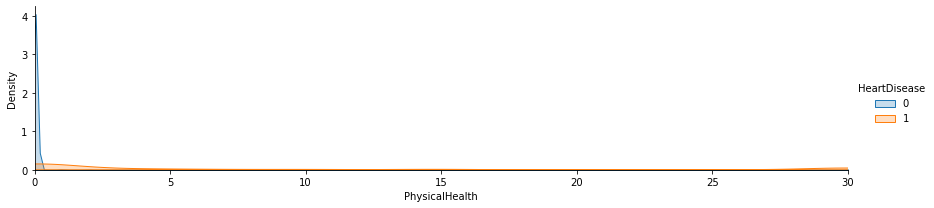

In [89]:
KDE('PhysicalHealth')

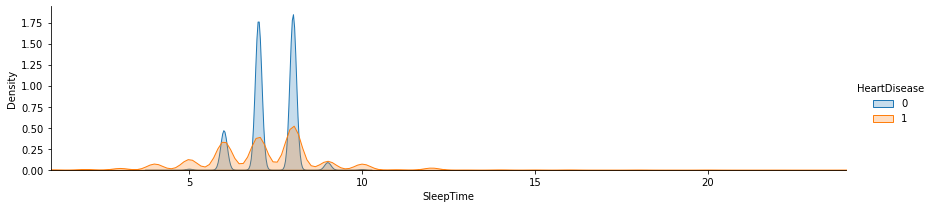

In [90]:
KDE('SleepTime')

In [91]:
df4.corr()

,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer,HeartDisease
BMI,1.000000,0.049441,0.014670,0.068767,0.192687,0.145983,0.257873,0.066262,-0.185498,-0.114441,0.293306,-0.210051,-0.031508,-0.067029,0.164275,0.120651,-0.018091,0.253337
Smoking,0.049441,1.000000,0.092053,0.076455,0.133507,0.112300,0.128243,0.101611,0.005786,-0.028858,0.099076,-0.128546,-0.014393,-0.025905,0.067483,0.042515,0.026792,0.189340
AlcoholDrinking,0.014670,0.092053,1.000000,0.024267,0.039746,0.072052,0.026511,0.008041,-0.059917,-0.012962,-0.007564,-0.042995,-0.000983,-0.002374,0.024382,0.000318,0.009680,0.111989
Stroke,0.068767,0.076455,0.024267,1.000000,0.236168,0.171132,0.256971,-0.045099,0.015393,-0.140675,0.169159,-0.172935,-0.067838,-0.018876,0.132583,0.137583,0.043969,0.284882
PhysicalHealth,0.192687,0.133507,0.039746,0.236168,1.000000,0.440993,0.520376,-0.089319,-0.039676,-0.149459,0.264498,-0.365403,-0.082941,-0.105898,0.240992,0.237105,0.053826,0.431588
MentalHealth,0.145983,0.112300,0.072052,0.171132,0.440993,1.000000,0.325887,-0.114732,-0.168178,-0.156602,0.169367,-0.237850,-0.065910,-0.138065,0.209618,0.137120,0.013027,0.336057
DiffWalking,0.257873,0.128243,0.026511,0.256971,0.520376,0.325887,1.000000,-0.134294,0.070244,-0.178967,0.300179,-0.412700,-0.113529,-0.075224,0.245212,0.240233,0.068561,0.446543
Sex,0.066262,0.101611,0.008041,-0.045099,-0.089319,-0.114732,-0.134294,1.000000,-0.114715,0.071277,-0.004047,0.099627,-0.016024,0.018666,-0.100898,-0.046308,0.066207,-0.063767
AgeCategory,-0.185498,0.005786,-0.059917,0.015393,-0.039676,-0.168178,0.070244,-0.114715,1.000000,0.128077,0.034799,-0.061437,0.048086,0.165630,-0.096953,0.046253,0.217923,0.006225
Race,-0.114441,-0.028858,-0.012962,-0.140675,-0.149459,-0.156602,-0.178967,0.071277,0.128077,1.000000,-0.170362,0.143604,0.073850,0.066569,-0.141057,-0.085409,0.079320,-0.276996


<AxesSubplot:>

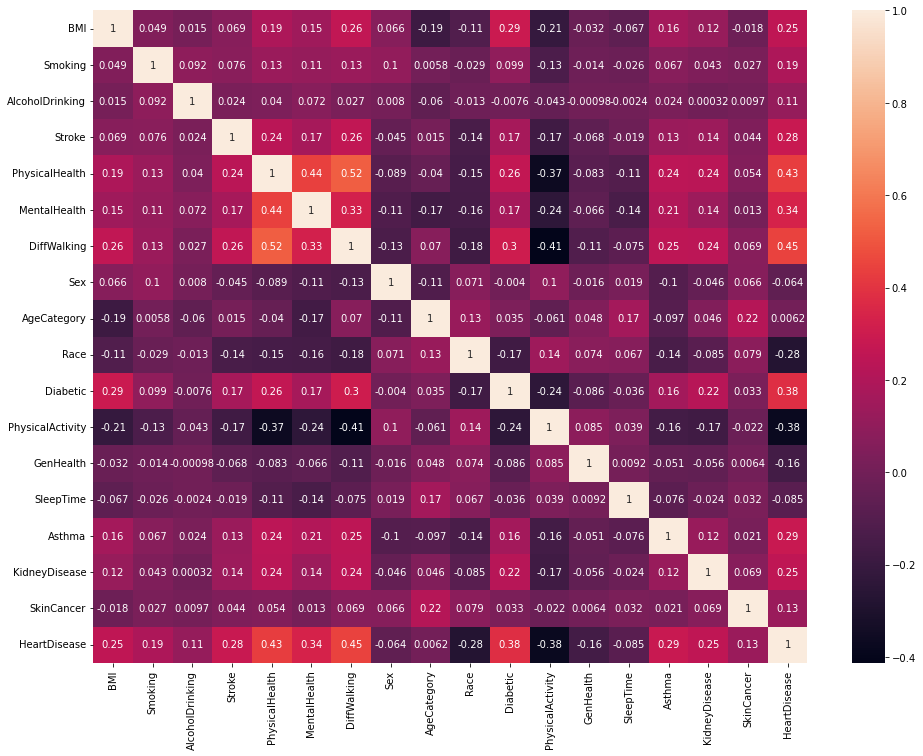

In [92]:
plt.figure(figsize=(16,12))
sns.heatmap(df4.corr(),annot=True)

# Split Dataset into Train and Test


In [93]:
from sklearn.model_selection import train_test_split

In [94]:
xtrain,xtest,ytrain,ytest=train_test_split(new_x,new_y,train_size=0.75,random_state=42)

In [95]:
xtest.head(50)

,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
13501,26.54,0,0,0,0.0,0.0,0,1,6,5,0,1,0,7.0,0,0,0
15356,25.46,0,0,0,0.0,0.0,0,1,12,5,0,1,2,7.0,0,0,1
11209,31.63,1,0,0,0.0,0.0,0,1,11,5,2,1,4,8.0,0,0,0
13251,23.63,1,0,0,0.0,0.0,0,0,7,5,0,1,4,7.0,0,0,0
27143,25.62,0,0,0,0.0,0.0,0,1,8,5,0,1,2,6.0,0,0,0
23543,21.80,0,0,0,0.0,0.0,0,0,12,5,0,1,4,7.0,0,0,1
53055,34.33,1,0,0,0.0,0.0,1,0,11,5,0,1,3,7.0,0,1,1
24954,25.80,0,0,0,0.0,0.0,0,1,9,4,0,1,4,8.0,0,0,0
45950,21.52,1,0,0,0.0,0.0,0,1,10,5,0,0,4,8.0,0,0,0
22977,30.04,0,0,0,0.0,0.0,0,1,8,5,0,1,0,6.0,0,0,0


In [96]:
ytest.head(50)

13501    0
15356    0
11209    0
13251    0
27143    0
23543    0
53055    1
24954    0
45950    1
22977    0
16311    0
39908    1
3272     0
29500    1
19044    0
6348     0
27159    0
38035    1
38851    1
12691    0
51261    1
15215    0
42017    1
26879    0
2969     0
31611    1
50076    1
1584     0
8780     0
33068    1
18554    0
2331     0
16357    0
44751    1
47413    1
48807    1
34124    1
7613     0
23330    0
43962    1
33249    1
26565    0
26852    0
1901     0
51418    1
12371    0
54482    1
40041    1
51557    1
14463    0
Name: HeartDisease, dtype: int32

In [97]:
#!pip install xgboost


In [98]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC 
from sklearn.ensemble import RandomForestClassifier

In [99]:
clf=DecisionTreeClassifier()
neigh=KNeighborsClassifier(n_neighbors= 50)
log=LogisticRegression()
svm = SVC(kernel='linear')
rt = RandomForestClassifier()

In [100]:
def model(xtrain,ytrain,xtest,ytest):
    model_name=['LogisticRegression','KNNClaccification','AdaBoostClassifier','DecisionTreeClassifier','XGBClassifier','SVM','RandomForestClassifier']
    accuracy=[]
    train_accuracy=[]

    #LogisticRegression
    log.fit(xtrain,ytrain)
    accuracy.append(log.score(xtest,ytest))
    train_accuracy.append(log.score(xtrain,ytrain))

    
    #KNNClassification
    neigh.fit(xtrain,ytrain)
    accuracy.append(neigh.score(xtest,ytest))
    train_accuracy.append(neigh.score(xtrain,ytrain))

    
    
    #DecisionTreeClassifier
    clf.fit(xtrain,ytrain)
    accuracy.append(clf.score(xtest,ytest))
    train_accuracy.append(clf.score(xtrain,ytrain))

    

    #SVM
    svm.fit(xtrain, ytrain)
    accuracy.append(svm.score(xtest,ytest))
    train_accuracy.append(svm.score(xtrain,ytrain))
    
    #Random Forest Classifier
    rt.fit(xtrain, ytrain)
    accuracy.append(rt.score(xtest,ytest))
    train_accuracy.append(rt.score(xtrain,ytrain))
    
    return model_name,accuracy,train_accuracy
    

In [101]:
model_name,test,train=model(xtrain,ytrain,xtest,ytest)

In [102]:
test

[0.8746986191276394,
 0.8419668298385329,
 0.8425513260758384,
 0.868196098487616,
 0.854314312851611]

In [103]:
svm.predict([['34.33','1','0','0','0','0','1','0','11','5','0','1','3','7','0','1','1']])#SVM shows the same result

array([1])

In [104]:
rt.predict([['34.33','1','0','0','0','0','1','0','11','5','0','1','3','7','0','1','1']])#Random Forest shows the same result

array([1])

In [105]:
def dataframe(y):
    vis={'Algorithm':['LogisticRegression','KNNClaccification','DecisionTreeClassifier','SVM','RandomForestClassifier'],
     'Accuracy':y
     
    } 
    accuracy=pd.DataFrame(vis)
    return accuracy


In [106]:
data=dataframe(test)

<AxesSubplot:title={'center':'Testing Accuracy Comparison'}, xlabel='Accuracy', ylabel='Algorithm'>

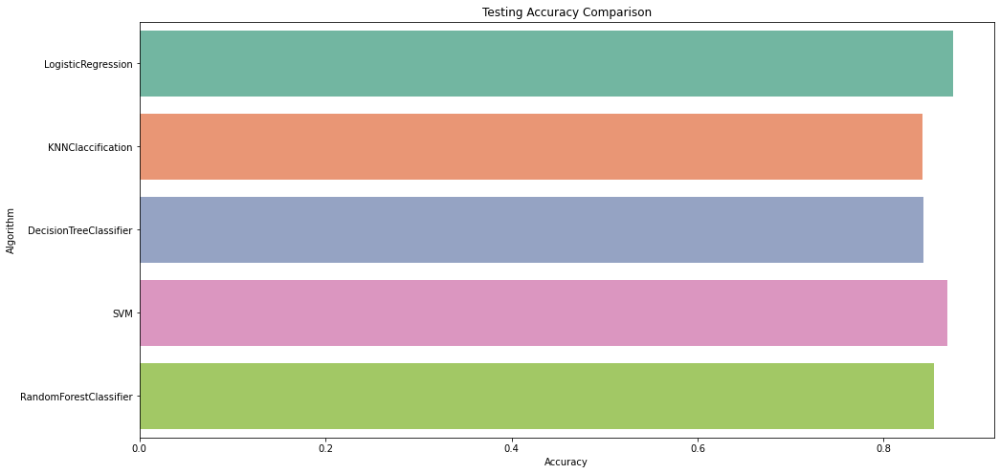

In [107]:
plt.figure(figsize=(16,8))

plt.title('Testing Accuracy Comparison')
sns.barplot(y="Algorithm",x='Accuracy',data=data,palette='Set2')


In [108]:
data2=dataframe(train)

<AxesSubplot:title={'center':'Trainging Accuracy Comparison'}, xlabel='Accuracy', ylabel='Algorithm'>

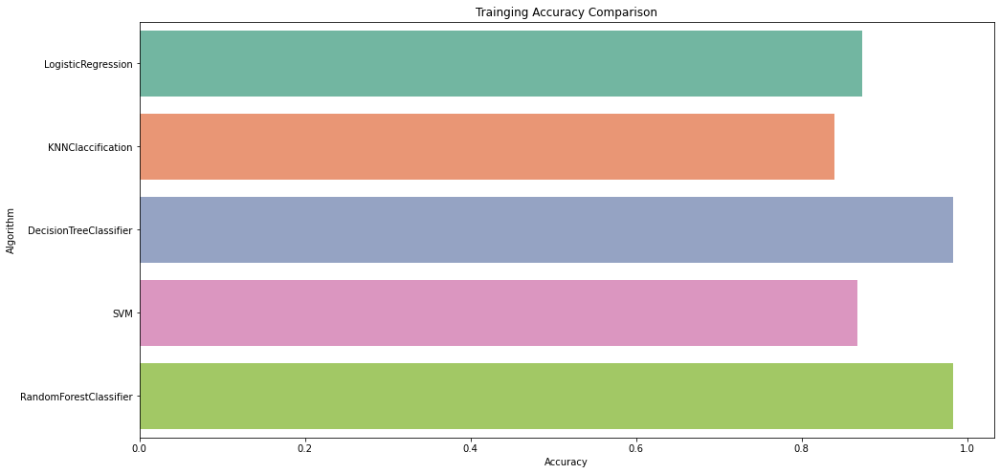

In [109]:
plt.figure(figsize=(16,8))

plt.title('Trainging Accuracy Comparison')
sns.barplot(y="Algorithm",x='Accuracy',data=data2,palette='Set2')


In [110]:
train

[0.8725979687766385,
 0.8399863610901386,
 0.9830731386541318,
 0.8668257872817166,
 0.9830487834579508]

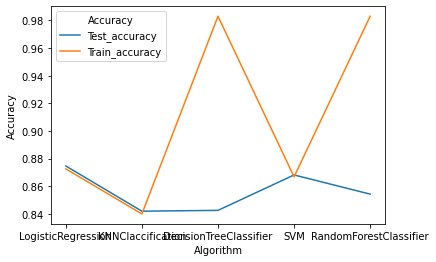

In [111]:
sns.lineplot(data=data, x="Algorithm", y="Accuracy")
sns.lineplot(data=data2, x="Algorithm", y="Accuracy")
plt.ylabel("Accuracy")
plt.legend(labels=["Test_accuracy","Train_accuracy"], title = "Accuracy")
plt.show()

In [112]:
from sklearn.metrics import classification_report, accuracy_score,confusion_matrix,roc_curve

In [113]:
pred_log=log.predict(xtest)
pred_dclf=clf.predict(xtest)
pred_neigh=neigh.predict(xtest)
pred_svm=svm.predict(xtest)
pred_rfc=rt.predict(xtest)


In [114]:
print("Report of Logistic Regression:\n\n",classification_report(ytest, pred_log), end ="\n\n\n\n")
print("Report of Knearest Neighbour Classificaiton:\n\n",classification_report(ytest, pred_neigh),  end ="\n\n\n\n")
print("Report of Support Vector Machine Classification:\n\n",classification_report(ytest, pred_svm),  end ="\n\n\n\n")
print("Report of Random Forest Classification:\n\n",classification_report(ytest, pred_rfc),  end ="\n\n\n\n")
print("Report of Decision Tree:\n\n",classification_report(ytest, pred_dclf), end ="\n\n\n\n")

Report of Logistic Regression:

               precision    recall  f1-score   support

           0       0.83      0.94      0.88      6825
           1       0.93      0.81      0.87      6862

    accuracy                           0.87     13687
   macro avg       0.88      0.87      0.87     13687
weighted avg       0.88      0.87      0.87     13687




Report of Knearest Neighbour Classificaiton:

               precision    recall  f1-score   support

           0       0.77      0.98      0.86      6825
           1       0.98      0.70      0.82      6862

    accuracy                           0.84     13687
   macro avg       0.87      0.84      0.84     13687
weighted avg       0.87      0.84      0.84     13687




Report of Support Vector Machine Classification:

               precision    recall  f1-score   support

           0       0.84      0.91      0.87      6825
           1       0.90      0.83      0.86      6862

    accuracy                           0.87  

# Confusion Matrix


In [115]:
cm_log=confusion_matrix(ytest,pred_log)
cm_dclf=confusion_matrix(ytest,pred_dclf)
cm_neigh=confusion_matrix(ytest,pred_neigh)
cm_svm=confusion_matrix(ytest,pred_svm)
cm_rfc=confusion_matrix(ytest,pred_rfc)

In [116]:
label_con=['True','False']


In [117]:
conf_mat=[cm_log,cm_svm,cm_rfc,cm_neigh,cm_dclf]

In [118]:
len(conf_mat)


5

In [119]:
algo=['Logistic Regression','Decision Tree Classification','Knearest Neighbour Classificaiton','Support Vector Machine Classification','Random Forest Classification']

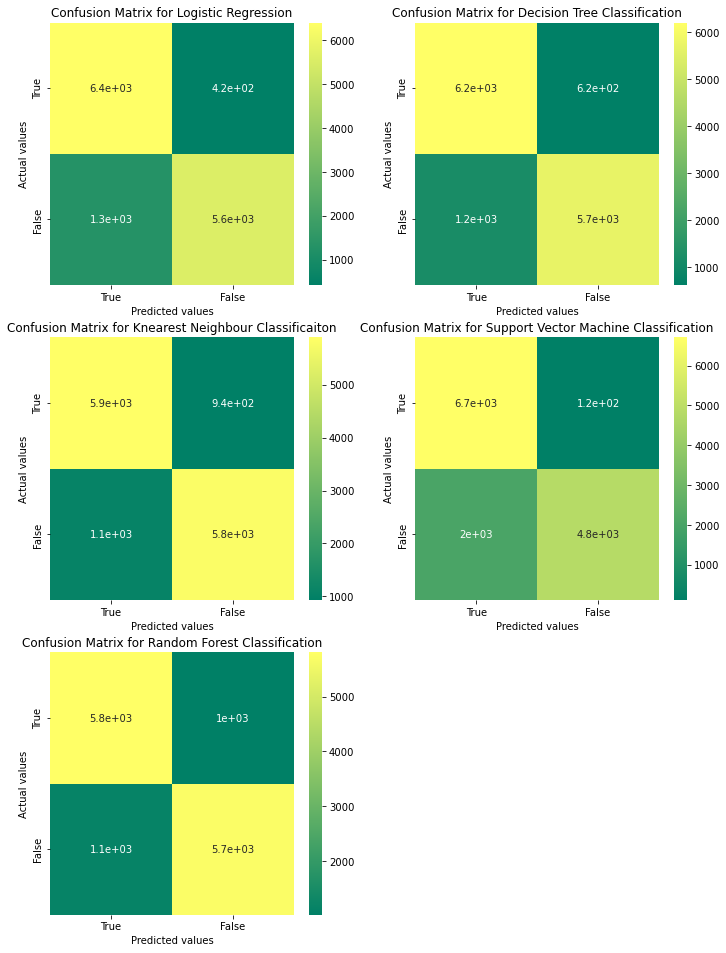

In [120]:
plt.figure(figsize=(12,28))
for i in range(1,6):

    plt.subplot(5,2,i)
    sns.heatmap(conf_mat[i-1],cmap='summer',annot=True,xticklabels=label_con,yticklabels=label_con)
    plt.xlabel('Predicted values')
    plt.ylabel('Actual values')
    plt.title(f'Confusion Matrix for {algo[i-1]}',color='black')

# ROC Curve


In [121]:
from sklearn.metrics import plot_roc_curve

In [122]:
list=[clf,neigh,log,svm,rt]
type(list[0])

sklearn.tree._classes.DecisionTreeClassifier

<Figure size 864x2016 with 0 Axes>

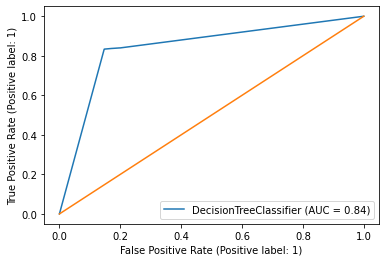

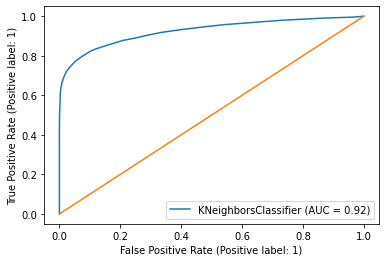

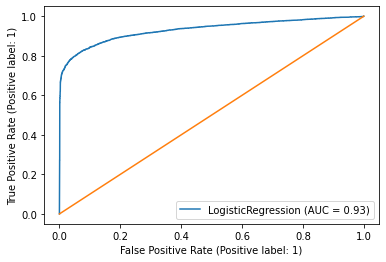

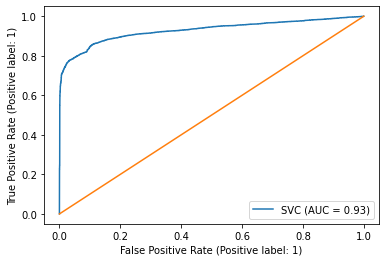

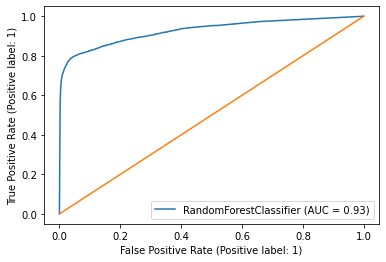

In [123]:
plt.figure(figsize=(12,28))
for i in range(1,6):
    plot_roc_curve(list[i-1], xtest, ytest)
    plt.plot([0,1],[0,1])

# Gradio deployment

In [124]:
df4.head()

,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer,HeartDisease
0,25.10,0,0,0,0.0,0.0,0,1,9,5,0,1,4,7.0,0,0,0,0
1,22.24,1,0,0,0.0,0.0,0,1,11,5,0,1,4,7.0,0,0,0,0
2,26.63,0,0,0,0.0,0.0,0,0,12,5,0,1,2,8.0,0,0,0,0
3,25.10,0,0,0,0.0,0.0,0,1,9,5,0,1,4,7.0,0,0,0,0
4,26.63,0,0,0,0.0,0.0,0,0,12,5,0,1,2,8.0,0,0,0,0


In [125]:
rt.predict([['34.33','1','0','0','0','0','1','0','11','5','0','1','3','7','0','1','1']])#Random Forest shows the same result

array([1])

In [126]:
clf.predict([['26.54','0','0','0','0','0','0','1','6','5','0','1','0','7','0','0','0']])#Actual value of row no 13501 is 0

array([0])

In [127]:
#!pip install gradio
import gradio as gr

In [128]:
def heart(BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer):
    
    HeartDisease = rt.predict([[BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer]])
    return HeartDisease
    

In [129]:
heart(26.54,0,0,0,0,0,0,1,6,5,0,1,0,7,0,0,0)

array([0])

In [130]:
interface = gr.Interface(
  fn = heart, #function = heart
  inputs = ['number','number','number','number','number','number','number','number','number',
            'number','number','number','number','number','number','number','number'],
  outputs = ['text']  


).launch(share=True)

Running on local URL:  http://127.0.0.1:7860
Running on public URL: https://e321f32f99ffc38207.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)
